In [2]:
# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.utils import save_image
from tqdm import tqdm
import torchvision.models as models
import torch.nn as nn
import torch.nn as nn
import os
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import time
from tqdm.notebook import tqdm
from PIL import Image, ImageFilter
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision.models import vgg19
from skimage.metrics import peak_signal_noise_ratio as calculate_psnr
from skimage.metrics import structural_similarity as calculate_ssim # For SSIM Loss if needed later
from tqdm import tqdm


In [1]:
def simulate_lr(hr_img, scale=4):
    """Downsamples a PIL HR image and applies Gaussian blur to create a blurry LR image."""
    if not isinstance(hr_img, Image.Image):
        raise TypeError("Expected PIL Image but got {}".format(type(hr_img)))
    # small = hr_img.resize((hr_img.width // scale, hr_img.height // scale), Image.BICUBIC)
    small = hr_img.filter(ImageFilter.GaussianBlur(radius=0.5))
    return small

In [5]:
!rm -rf /content/drive  # Warning: This will delete everything in /content/drive!
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


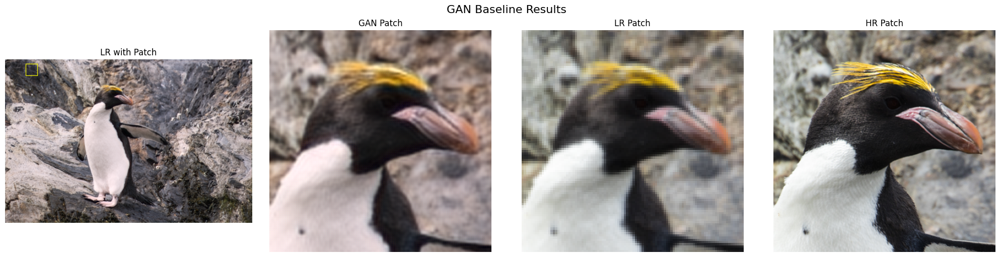

In [13]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

img_dir = "/content/drive/MyDrive/Final-SISR/Results"


# Load HR and LR images
sr_path = os.path.join(img_dir, "image_1_GAN-Baseline_pin.png")
hr_path = os.path.join(img_dir, "image_1_HR.png")
lr_path = os.path.join(img_dir, "image_1_LR.png")

sr_img = Image.open(sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = simulate_lr(Image.open(lr_path).convert("RGB"))


# Define crop box in LR coordinates
# (left, top, right, bottom)
# Patch box
# For a large 80×80 patch starting near the top center
patch_width = 100
patch_height = 100
# Center horizontally (e.g., center of 160 is 80)
left = 220 - patch_width // 2   # 40
right = left + patch_width     # 120
# Top-aligned near top (e.g., start at 20)
top = 40
bottom = top + patch_height    # 100
crop_box_lr = (left, top, right, bottom)  # (40, 20, 120, 100)
# crop_box_lr = (200, 70, 180, 140)
lr_patch = lr_img.crop(crop_box_lr)

# Draw yellow rectangle on LR image
sr_with_box = sr_img.copy()
draw = ImageDraw.Draw(sr_with_box)
draw.rectangle(crop_box_lr, outline="yellow", width=5)

# Corresponding HR patch (×4 upscale)
crop_box_hr = tuple(v * 4 for v in crop_box_lr)
hr_patch = hr_img.crop(crop_box_hr)

# Corresponding HR patch (×4 upscale)
crop_box_sr = tuple(v * 4 for v in crop_box_lr)
sr_patch = sr_img.crop(crop_box_sr)

# Plot side-by-side in center
fig, axs = plt.subplots(1, 4, figsize=(20, 5), layout="constrained")  # auto-center
fig.suptitle("GAN Baseline Results", fontsize=16)

# Display images
axs[0].imshow(sr_with_box)
axs[0].set_title("LR with Patch")
axs[0].axis("off")

axs[1].imshow(sr_patch)
axs[1].set_title("GAN Patch")
axs[1].axis("off")

axs[2].imshow(lr_patch)
axs[2].set_title("LR Patch")
axs[2].axis("off")

axs[3].imshow(hr_patch)
axs[3].set_title("HR Patch")
axs[3].axis("off")

plt.show()


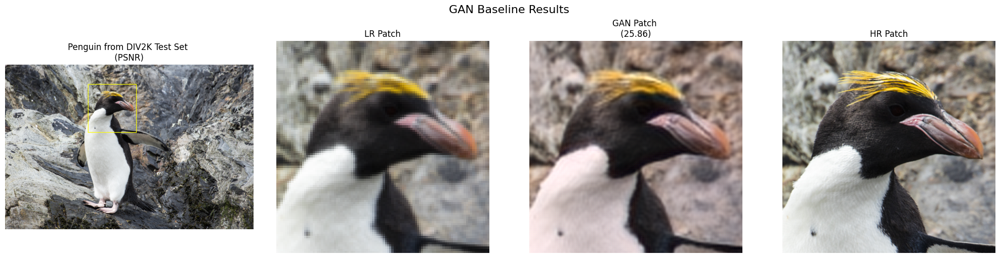

In [2]:
import os
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt

# === Image Directory ===
img_dir = "/content/drive/MyDrive/Final-SISR/Results"

# === Load Images ===
sr_path = os.path.join(img_dir, "image_1_GAN-Baseline_pin.png")
hr_path = os.path.join(img_dir, "image_1_HR.png")
lr_path = os.path.join(img_dir, "image_1_LR.png")

sr_img = Image.open(sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = Image.open(lr_path).convert("RGB")
lr_img = simulate_lr(lr_img)  # Optional simulation

# === Define Patch Coordinates in LR ===
patch_width = 100
patch_height = 100
left = 220 - patch_width // 2
top = 40
right = left + patch_width
bottom = top + patch_height
crop_box_lr = (left, top, right, bottom)

# === Draw rectangle on SR ===
hr_with_box = hr_img.copy()
draw = ImageDraw.Draw(hr_with_box)
draw.rectangle(tuple(v * 4 for v in crop_box_lr), outline="yellow", width=5)

# === Crop Patches ===
lr_patch = lr_img.crop(crop_box_lr)
hr_patch = hr_img.crop(tuple(v * 4 for v in crop_box_lr))
sr_patch = sr_img.crop(tuple(v * 4 for v in crop_box_lr))

# === Plot ===
fig, axs = plt.subplots(1, 4, figsize=(20, 5), layout="constrained")
fig.suptitle("GAN Baseline Results", fontsize=16)

axs[0].imshow(hr_with_box)
axs[0].set_title(f"Penguin from DIV2K Test Set \n (PSNR) ")
axs[0].axis("off")

axs[1].imshow(lr_patch)
axs[1].set_title("LR Patch")
axs[1].axis("off")

axs[2].imshow(sr_patch)
axs[2].set_title(f"GAN Patch \n (25.86) ")
axs[2].axis("off")


axs[3].imshow(hr_patch)
axs[3].set_title("HR Patch")
axs[3].axis("off")

plt.show()


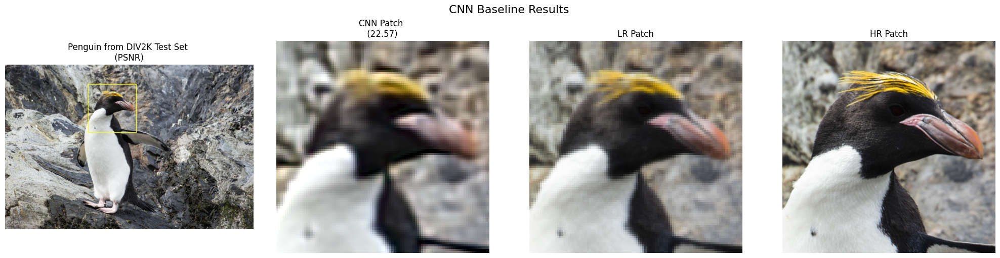

In [7]:
import os
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt

# === Image Directory ===
img_dir = "/content/drive/MyDrive/Final-SISR/Results"

# === Load Images ===
sr_path = os.path.join(img_dir, "image_1_CNN-Baseline_pin.png")
hr_path = os.path.join(img_dir, "image_1_HR.png")
lr_path = os.path.join(img_dir, "image_1_LR.png")

sr_img = Image.open(sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = Image.open(lr_path).convert("RGB")
lr_img = simulate_lr(lr_img)  # Optional simulation

scale_factor = sr_img.width // lr_img.width


# === Define Patch Coordinates in LR ===
patch_width = 100
patch_height = 100
left = 220 - patch_width // 2
top = 40
right = left + patch_width
bottom = top + patch_height
crop_box_lr = (left, top, right, bottom)

# === Draw rectangle on SR ===
hr_with_box = hr_img.copy()
draw = ImageDraw.Draw(hr_with_box)
draw.rectangle(tuple(v * 4 for v in crop_box_lr), outline="yellow", width=5)

# === Crop Patches ===
lr_patch = lr_img.crop(crop_box_lr)
hr_patch = hr_img.crop(tuple(v * 4 for v in crop_box_lr))
sr_patch = sr_img.crop(tuple(v * scale_factor for v in crop_box_lr))

# === Plot ===
fig, axs = plt.subplots(1, 4, figsize=(20, 5), layout="constrained")
fig.suptitle("CNN Baseline Results", fontsize=16)

axs[0].imshow(hr_with_box)
axs[0].set_title(f"Penguin from DIV2K Test Set \n (PSNR) ")
axs[0].axis("off")

axs[1].imshow(sr_patch)
axs[1].set_title(f"CNN Patch \n (22.57) ")
axs[1].axis("off")

axs[2].imshow(lr_patch)
axs[2].set_title("LR Patch")
axs[2].axis("off")

axs[3].imshow(hr_patch)
axs[3].set_title("HR Patch")
axs[3].axis("off")

plt.show()


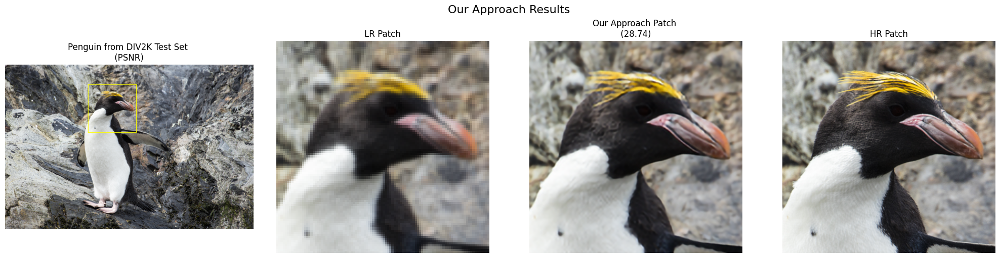

In [10]:
import os
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt

# === Image Directory ===
img_dir = "/content/drive/MyDrive/Final-SISR/Results"

# === Load Images ===
sr_path = os.path.join(img_dir, "0801x4_Proposed-Model.png")
hr_path = os.path.join(img_dir, "image_1_HR.png")
lr_path = os.path.join(img_dir, "image_1_LR.png")

sr_img = Image.open(sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = Image.open(lr_path).convert("RGB")
lr_img = simulate_lr(lr_img)  # Optional simulation

# === Define Patch Coordinates in LR ===
patch_width = 100
patch_height = 100
left = 220 - patch_width // 2
top = 40
right = left + patch_width
bottom = top + patch_height
crop_box_lr = (left, top, right, bottom)

# === Draw rectangle on SR ===
hr_with_box = hr_img.copy()
draw = ImageDraw.Draw(hr_with_box)
draw.rectangle(tuple(v * 4 for v in crop_box_lr), outline="yellow", width=5)

# === Crop Patches ===
lr_patch = lr_img.crop(crop_box_lr)
hr_patch = hr_img.crop(tuple(v * 4 for v in crop_box_lr))
sr_patch = sr_img.crop(tuple(v * 4 for v in crop_box_lr))

# === Plot ===
fig, axs = plt.subplots(2, 4, figsize=(20, 5), layout="constrained")
fig.suptitle("Our Approach Results", fontsize=16)

axs[0].imshow(hr_with_box)
axs[0].set_title(f"Penguin from DIV2K Test Set \n (PSNR) ")
axs[0].axis("off")

axs[1].imshow(lr_patch)
axs[1].set_title("LR Patch")
axs[1].axis("off")

axs[2].imshow(sr_patch)
axs[2].set_title(f"Our Approach Patch \n (28.74) ")
axs[2].axis("off")


axs[3].imshow(hr_patch)
axs[3].set_title("HR Patch")
axs[3].axis("off")

plt.show()


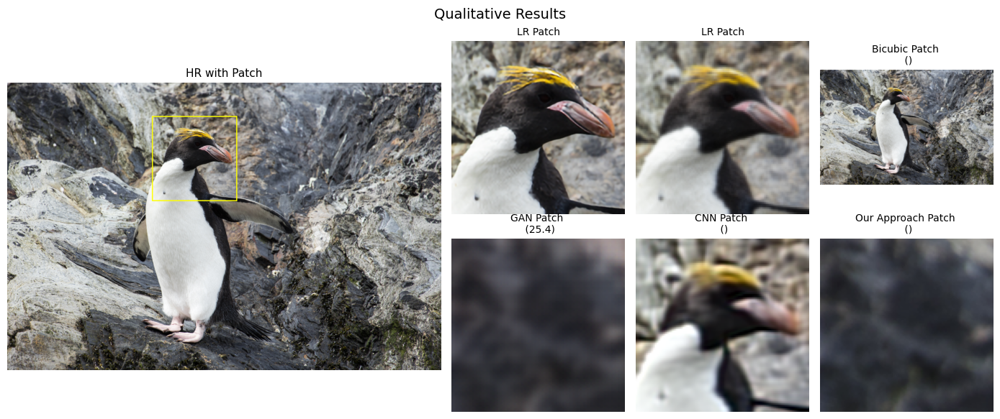

In [16]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# === Image Directory ===
img_dir = "/content/drive/MyDrive/Final-SISR/Results"

# === Load Images ===
our_sr_path = os.path.join(img_dir, "0801x4_Proposed-Model.png")
hr_path = os.path.join(img_dir, "image_1_HR.png")
lr_path = os.path.join(img_dir, "image_1_LR.png")
cnn_sr_path = os.path.join(img_dir, "image_1_CNN-Baseline_pin.png")
gan_sr_path = os.path.join(img_dir, "image_1_GAN-Baseline_pin.png")


our_sr_img = Image.open(our_sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = Image.open(lr_path).convert("RGB")
lr_img = simulate_lr(Image.open(lr_path).convert("RGB"))  # Optional simulation
bicubic_img = Image.open(lr_path).convert("RGB")
cnn_sr_img= Image.open(cnn_sr_path).convert("RGB")
gan_sr_img = Image.open(gan_sr_path).convert("RGB")


# === Define Patch Coordinates in LR ===
patch_width = 100
patch_height = 100
left = 220 - patch_width // 2
top = 40
right = left + patch_width
bottom = top + patch_height
crop_box_lr = (left, top, right, bottom)


# Smaller overall figure, but wider HR column
fig = plt.figure(figsize=(14, 6))
gs = gridspec.GridSpec(2, 4, width_ratios=[2.5, 1, 1, 1])  # HR column wider

cnn_scale_factor = cnn_sr_img.width // lr_img.width


lr_patch = lr_img.crop(crop_box_lr)
our_sr_patch = our_sr_img.crop(crop_box_lr)
hr_patch = hr_img.crop(crop_box_lr)
bicubic_patch = bicubic_img.crop(crop_box_lr)
cnn_sr_patch= cnn_sr_img.crop(crop_box_lr)
gan_sr_patch = gan_sr_img.crop(crop_box_lr)




fig.suptitle("Qualitative Results", fontsize=14)

# HR image (merged across both rows)
ax_hr = fig.add_subplot(gs[:, 0])
ax_hr.imshow(hr_with_box)
ax_hr.set_title("HR with Patch", fontsize=11)
ax_hr.axis("off")

# === First row ===
ax_cnn_sr = fig.add_subplot(gs[0, 1])
ax_cnn_sr.imshow(sr_patch)
ax_cnn_sr.set_title("LR Patch", fontsize=10)
ax_cnn_sr.axis("off")

ax_cnn_lr = fig.add_subplot(gs[0, 2])
ax_cnn_lr.imshow(lr_patch)
ax_cnn_lr.set_title("LR Patch", fontsize=10)
ax_cnn_lr.axis("off")

ax_cnn_hr = fig.add_subplot(gs[0, 3])
ax_cnn_hr.imshow(bicubic_img)
ax_cnn_hr.set_title(f"Bicubic Patch \n ()", fontsize=10)
ax_cnn_hr.axis("off")

# === Second row ===
ax_gan_sr = fig.add_subplot(gs[1, 1])
ax_gan_sr.imshow(gan_sr_patch)
ax_gan_sr.set_title(f"GAN Patch \n (25.4)", fontsize=10)
ax_gan_sr.axis("off")

ax_gan_lr = fig.add_subplot(gs[1, 2])
ax_gan_lr.imshow(cnn_sr_patch)
ax_gan_lr.set_title(f"CNN Patch \n ()", fontsize=10)
ax_gan_lr.axis("off")

ax_gan_hr = fig.add_subplot(gs[1, 3])
ax_gan_hr.imshow(hr_patch)
ax_gan_hr.set_title(f"Our Approach Patch \n ()", fontsize=10)
ax_gan_hr.axis("off")

plt.tight_layout()
plt.show()


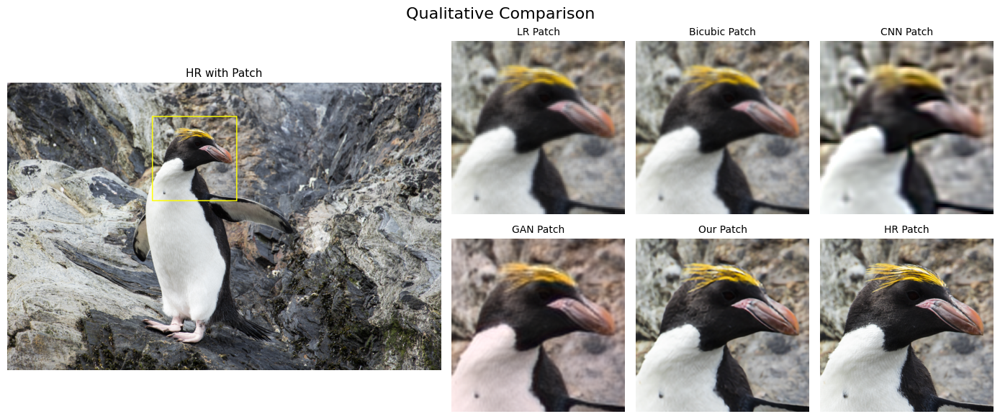

In [19]:
import os
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# === Image Directory ===
img_dir = "/content/drive/MyDrive/Final-SISR/Results"

# === Load Images ===
our_sr_path = os.path.join(img_dir, "0801x4_Proposed-Model.png")
hr_path = os.path.join(img_dir, "image_1_HR.png")
lr_path = os.path.join(img_dir, "image_1_LR.png")
cnn_sr_path = os.path.join(img_dir, "image_1_CNN-Baseline_pin.png")
gan_sr_path = os.path.join(img_dir, "image_1_GAN-Baseline_pin.png")

our_sr_img = Image.open(our_sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = Image.open(lr_path).convert("RGB")
lr_img = simulate_lr(lr_img)  # Optional simulation
bicubic_img = lr_img.resize(hr_img.size, Image.BICUBIC)
cnn_sr_img = Image.open(cnn_sr_path).convert("RGB")
gan_sr_img = Image.open(gan_sr_path).convert("RGB")

# === Define Patch Box in LR ===
patch_width = 100
patch_height = 100
left = 220 - patch_width // 2
top = 40
crop_box_lr = (left, top, left + patch_width, top + patch_height)

# === Calculate scale factor per SR image ===
scale = hr_img.width // lr_img.width
crop_box_hr = tuple(v * scale for v in crop_box_lr)

# === Crop Patches ===
lr_patch = lr_img.crop(crop_box_lr)
bicubic_patch = bicubic_img.crop(crop_box_hr)
cnn_patch = cnn_sr_img.crop(tuple(v * scale_factor for v in crop_box_lr))
gan_patch = gan_sr_img.crop(crop_box_hr)
our_patch = our_sr_img.crop(crop_box_hr)
hr_patch = hr_img.crop(crop_box_hr)

# === Draw yellow rectangle on HR ===
hr_with_box = hr_img.copy()
draw = ImageDraw.Draw(hr_with_box)
draw.rectangle(crop_box_hr, outline="yellow", width=5)

# === Setup Plot ===
fig = plt.figure(figsize=(14, 6))
gs = gridspec.GridSpec(2, 4, width_ratios=[2.5, 1, 1, 1])
fig.suptitle("Qualitative Comparison", fontsize=16)

# === HR full image (merged row)
ax_hr = fig.add_subplot(gs[:, 0])
ax_hr.imshow(hr_with_box)
ax_hr.set_title("HR Penguin from DIV2K Test Set \n (PSNR)", fontsize=11)
ax_hr.axis("off")

# === First Row (Top) ===
fig.add_subplot(gs[0, 1]).imshow(lr_patch)
plt.title("LR Patch", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[0, 2]).imshow(bicubic_patch)
plt.title(f"Bicubic Patch \n () ", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[0, 3]).imshow(cnn_patch)
plt.title(f"CNN Patch \n () ", fontsize=10)
plt.axis("off")

# === Second Row (Bottom) ===
fig.add_subplot(gs[1, 1]).imshow(gan_patch)
plt.title(f"GAN Patch \n ()", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[1, 2]).imshow(our_patch)
plt.title(f"Our Patch \ ()", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[1, 3]).imshow(hr_patch)
plt.title("HR Patch", fontsize=10)
plt.axis("off")

plt.tight_layout()
plt.show()


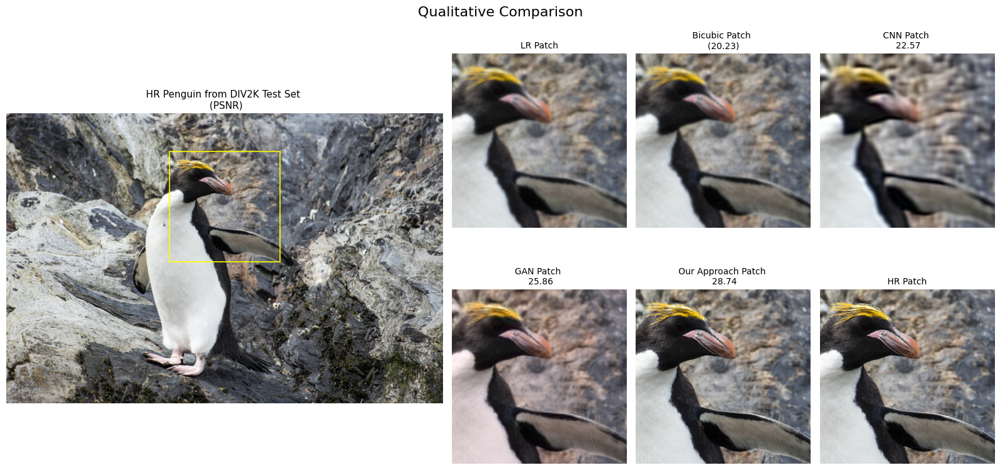

In [27]:
import os
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# === Image Directory ===
img_dir = "/content/drive/MyDrive/Final-SISR/Results"

# === Load Images ===
our_sr_path = os.path.join(img_dir, "0801x4_Proposed-Model.png")
hr_path = os.path.join(img_dir, "image_1_HR.png")
lr_path = os.path.join(img_dir, "image_1_LR.png")
cnn_sr_path = os.path.join(img_dir, "image_1_CNN-Baseline_pin.png")
gan_sr_path = os.path.join(img_dir, "image_1_GAN-Baseline_pin.png")

our_sr_img = Image.open(our_sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = Image.open(lr_path).convert("RGB")
lr_img = simulate_lr(lr_img)  # Optional simulation
bicubic_img = lr_img.resize(hr_img.size, Image.BICUBIC)
cnn_sr_img = Image.open(cnn_sr_path).convert("RGB")
gan_sr_img = Image.open(gan_sr_path).convert("RGB")

# === Define Patch Box in LR ===
patch_width = 130
patch_height = 130
left = lr_img.width // 2 - patch_width // 2
top = lr_img.height // 2 - patch_height // 2 - 60
crop_box_lr = (left, top, left + patch_width, top + patch_height)

# === Calculate scale factor per SR image ===
scale = hr_img.width // lr_img.width
crop_box_hr = tuple(v * scale for v in crop_box_lr)

# === Crop Patches ===
lr_patch = lr_img.crop(crop_box_lr)
bicubic_patch = bicubic_img.crop(crop_box_hr)
cnn_patch = cnn_sr_img.crop(tuple(v * scale_factor for v in crop_box_lr))
gan_patch = gan_sr_img.crop(crop_box_hr)
our_patch = our_sr_img.crop(crop_box_hr)
hr_patch = hr_img.crop(crop_box_hr)

# === Draw yellow rectangle on HR ===
hr_with_box = hr_img.copy()
draw = ImageDraw.Draw(hr_with_box)
draw.rectangle(crop_box_hr, outline="yellow", width=5)

# === Setup Plot ===
fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(2, 4, width_ratios=[2.5, 1, 1, 1])
fig.suptitle("Qualitative Comparison", fontsize=16)

# === HR full image (merged row)
ax_hr = fig.add_subplot(gs[:, 0])
ax_hr.imshow(hr_with_box)
ax_hr.set_title("HR Penguin from DIV2K Test Set \n (PSNR)", fontsize=11)
ax_hr.axis("off")

# === First Row (Top) ===
fig.add_subplot(gs[0, 1]).imshow(lr_patch)
plt.title("LR Patch", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[0, 2]).imshow(bicubic_patch)
plt.title(f"Bicubic Patch \n (20.23) ", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[0, 3]).imshow(cnn_patch)
plt.title(f"CNN Patch \n 22.57", fontsize=10)
plt.axis("off")

# === Second Row (Bottom) ===
fig.add_subplot(gs[1, 1]).imshow(gan_patch)
plt.title(f"GAN Patch \n 25.86", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[1, 2]).imshow(our_patch)
plt.title(f"Our Approach Patch \n 28.74", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[1, 3]).imshow(hr_patch)
plt.title("HR Patch", fontsize=10)
plt.axis("off")

plt.tight_layout()
plt.show()


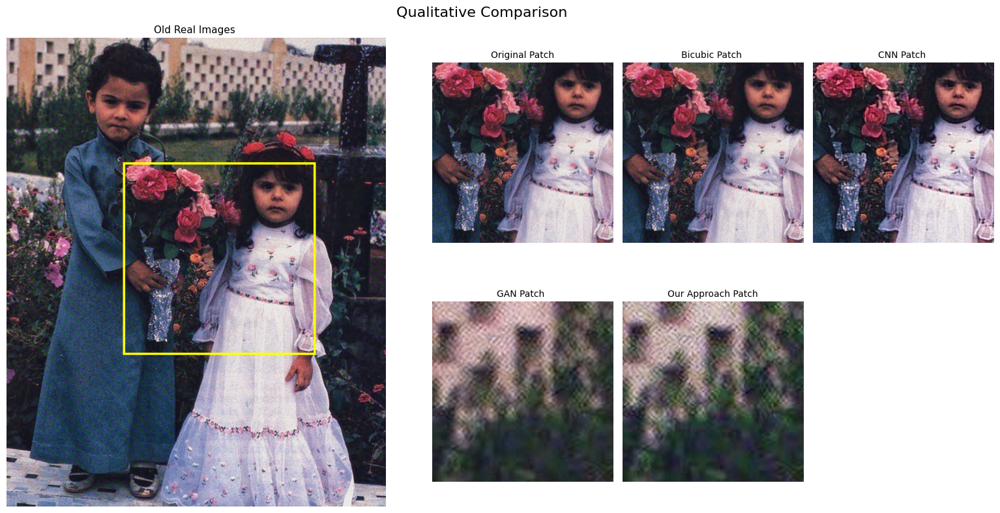

In [50]:
import os
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# === Image Directory ===
img_dir = "/content/drive/MyDrive/Final-SISR/Results"
img_dir2 = "/content/drive/MyDrive/Final-SISR/Test-Images"

# === Load Images ===
our_sr_path = os.path.join(img_dir, "image_2_Proposed-Model.png")
hr_path = os.path.join(img_dir2, "PHOTO-2.jpg")
lr_path = os.path.join(img_dir2, "PHOTO-2.jpg")
cnn_sr_path = os.path.join(img_dir, "image_2_CNN-Baseline.png")
gan_sr_path = os.path.join(img_dir, "image_2_GAN-Baseline.png")

our_sr_img = Image.open(our_sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = Image.open(lr_path).convert("RGB")
lr_img = simulate_lr(lr_img)  # Optional simulation
bicubic_img = lr_img.resize(hr_img.size, Image.BICUBIC)
cnn_sr_img = Image.open(cnn_sr_path).convert("RGB")
gan_sr_img = Image.open(gan_sr_path).convert("RGB")

# === Define Patch Box in LR ===
patch_width = 420
patch_height = 420
left = lr_img.width // 2 - patch_width // 2 + 50
top = lr_img.height // 2 - patch_height // 2 - 30
crop_box_lr = (left, top, left + patch_width, top + patch_height)

# === Calculate scale factor per SR image ===
scale = hr_img.width // lr_img.width
crop_box_hr = tuple(v * scale for v in crop_box_lr)

# === Crop Patches ===
lr_patch = lr_img.crop(crop_box_lr)
bicubic_patch = bicubic_img.crop(crop_box_hr)
cnn_patch = cnn_sr_img.crop(tuple(v * scale_factor for v in crop_box_lr))
gan_patch = gan_sr_img.crop(crop_box_hr)
our_patch = our_sr_img.crop(crop_box_hr)
hr_patch = hr_img.crop(crop_box_hr)

# === Draw yellow rectangle on HR ===
hr_with_box = hr_img.copy()
draw = ImageDraw.Draw(hr_with_box)
draw.rectangle(crop_box_hr, outline="yellow", width=5)

# === Setup Plot ===
fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(2, 4, width_ratios=[2.5, 1, 1, 1])
fig.suptitle("Qualitative Comparison", fontsize=16)

# === HR full image (merged row)
ax_hr = fig.add_subplot(gs[:, 0])
ax_hr.imshow(hr_with_box)
ax_hr.set_title("Old Real Images ", fontsize=11)
ax_hr.axis("off")

# === First Row (Top) ===
fig.add_subplot(gs[0, 1]).imshow(lr_patch)
plt.title("Original Patch", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[0, 2]).imshow(bicubic_patch)
plt.title(f"Bicubic Patch ", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[0, 3]).imshow(cnn_patch)
plt.title(f"CNN Patch ", fontsize=10)
plt.axis("off")

# === Second Row (Bottom) ===
fig.add_subplot(gs[1, 1]).imshow(gan_patch)
plt.title(f"GAN Patch ", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[1, 2]).imshow(our_patch)
plt.title(f"Our Approach Patch", fontsize=10)
plt.axis("off")


plt.tight_layout()
plt.show()


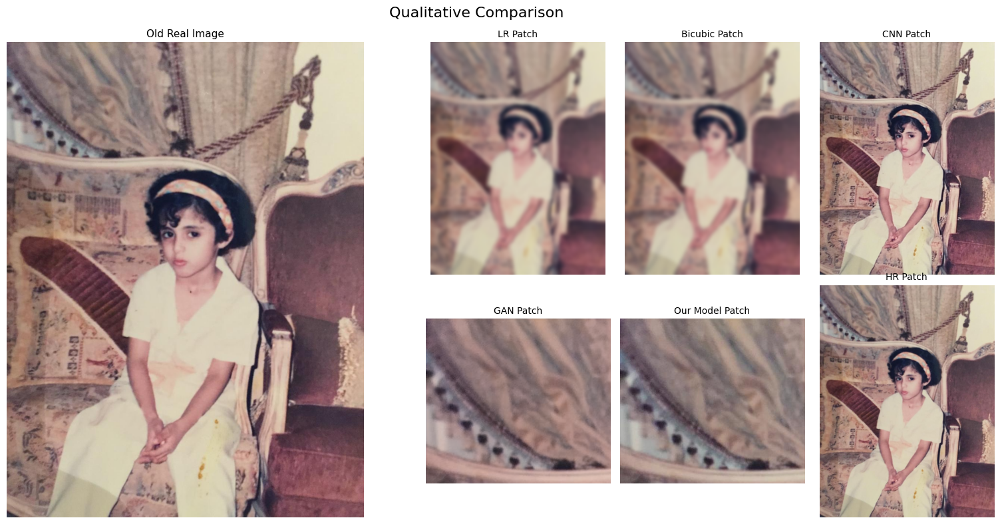

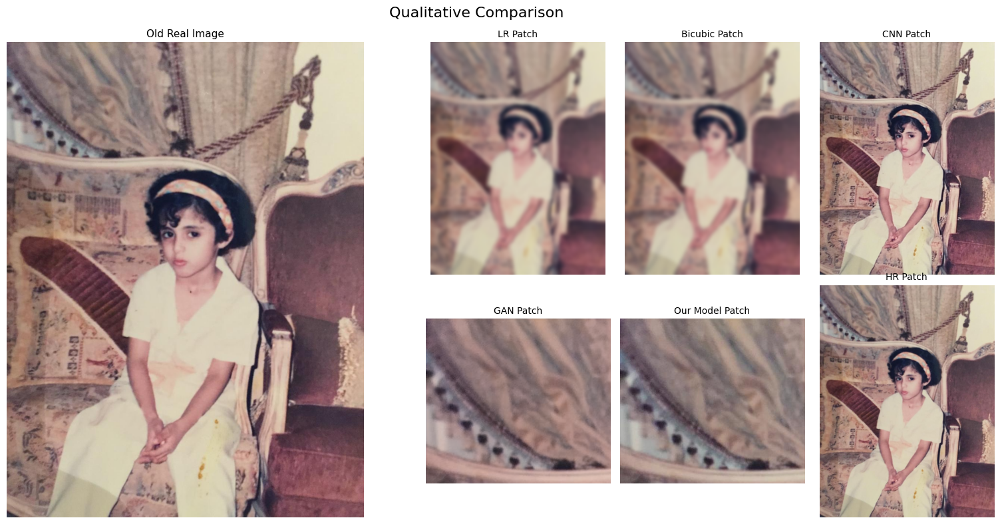

In [47]:
import os
from PIL import Image, ImageDraw, ImageFilter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# === Optional: Simulate LR ===
def simulate_blurry_lr(img, scale=4):
    small = img.resize((img.width // scale, img.height // scale), Image.BICUBIC)
    return small.filter(ImageFilter.GaussianBlur(radius=2.5))

# === Image Directories ===
img_dir = "/content/drive/MyDrive/Final-SISR/Results"
img_dir2 = "/content/drive/MyDrive/Final-SISR/Test-Images"

# === Load Images ===
our_sr_path = os.path.join(img_dir, "image_1_Proposed-Model.png")
cnn_sr_path = os.path.join(img_dir, "image_1_CNN-Baseline.png")
gan_sr_path = os.path.join(img_dir, "image_1_GAN-Baseline.png")

hr_path = os.path.join(img_dir2, "PHOTO-1.jpg")
lr_path = os.path.join(img_dir2, "PHOTO-1.jpg")

our_sr_img = Image.open(our_sr_path).convert("RGB")
cnn_sr_img = Image.open(cnn_sr_path).convert("RGB")
gan_sr_img = Image.open(gan_sr_path).convert("RGB")
hr_img = Image.open(hr_path).convert("RGB")
lr_img = simulate_blurry_lr(Image.open(lr_path).convert("RGB"))  # optional

bicubic_img = lr_img.resize(hr_img.size, Image.BICUBIC)

# === Define Patch Box in LR ===
patch_width = 420
patch_height = 420
left = lr_img.width // 2 - patch_width // 2 + 50
top = lr_img.height // 2 - patch_height // 2 - 30
crop_box_lr = (left, top, left + patch_width, top + patch_height)

# === Calculate scale from LR to HR ===
scale = hr_img.width // lr_img.width
crop_box_hr = tuple(v * scale for v in crop_box_lr)

# === Safe crop helper ===
def safe_crop(img, box, label):
    w, h = img.size
    box = [min(max(0, x), w if i % 2 == 0 else h) for i, x in enumerate(box)]
    return img.crop(box)

# === Crop Patches ===
lr_patch = safe_crop(lr_img, crop_box_lr, "LR")
bicubic_patch = safe_crop(bicubic_img, crop_box_hr, "Bicubic")
cnn_patch = safe_crop(cnn_sr_img, crop_box_hr, "CNN")
gan_patch = safe_crop(gan_sr_img, crop_box_hr, "GAN")
our_patch = safe_crop(our_sr_img, crop_box_hr, "Ours")
hr_patch = safe_crop(hr_img, crop_box_hr, "HR")

# === Draw yellow box on HR ===
hr_with_box = hr_img.copy()
draw = ImageDraw.Draw(hr_with_box)
draw.rectangle(crop_box_hr, outline="yellow", width=5)

# === Plot ===
fig = plt.figure(figsize=(16, 8))
gs = gridspec.GridSpec(2, 4, width_ratios=[2.5, 1, 1, 1])
fig.suptitle("Qualitative Comparison", fontsize=16)

# === HR large image ===
ax_hr = fig.add_subplot(gs[:, 0])
ax_hr.imshow(hr_with_box)
ax_hr.set_title("Old Real Image", fontsize=11)
ax_hr.axis("off")

# === First row ===
fig.add_subplot(gs[0, 1]).imshow(lr_patch)
plt.title("LR Patch", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[0, 2]).imshow(bicubic_patch)
plt.title("Bicubic Patch", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[0, 3]).imshow(cnn_patch)
plt.title("CNN Patch", fontsize=10)
plt.axis("off")

# === Second row ===
fig.add_subplot(gs[1, 1]).imshow(gan_patch)
plt.title("GAN Patch", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[1, 2]).imshow(our_patch)
plt.title("Our Model Patch", fontsize=10)
plt.axis("off")

fig.add_subplot(gs[1, 3]).imshow(hr_patch)
plt.title("HR Patch", fontsize=10)
plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
img_dir = "/content/drive/MyDrive/Final-SISR/Test-Images"
img_names = sorted(os.listdir(img_dir))  # Will list all image filenames

# Optional: Print the names
print(img_names[:4])

import torchvision.transforms as transforms
import torch

to_tensor = transforms.ToTensor()

test_lr_images = []

for name in img_names[:4]:  # Load only first 4
    img_path = os.path.join(img_dir, name)
    img = Image.open(img_path).convert("RGB")
    tensor_img = to_tensor(img)
    test_lr_images.append(tensor_img)


['PHOTO-1.jpg', 'PHOTO-2.jpg', 'PHOTO-3.jpg', 'PHOTO-4.jpg']


In [ ]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

hr_img = to_tensor(hr_img)
lr_img = to_tensor(lr_img)

test_hr_images = [hr_img]
test_lr_images = [lr_img]


In [ ]:
import torch, gc, os
from torchvision.transforms import ToPILImage
from skimage.metrics import peak_signal_noise_ratio as calculate_psnr

# === Devices ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cpu = torch.device("cpu")
to_pil = ToPILImage()

# === Define your models and checkpoints ===
model_defs = [
    # (EDSR, "/content/drive/MyDrive/Final-SISR/Models/hybrid4_model_weights.pth", "Our-hybrid4"),
    (SRCNN, "/content/drive/MyDrive/Final-SISR/Models/sisr_cnn_10_2.pth", "CNN-Baseline"),
    (Generator, "/content/drive/MyDrive/Final-SISR/Models/sisr_gan_10_2.pth", "GAN-Baseline")
]

# === Directories ===
save_dir = "/content/drive/MyDrive/Final-SISR/Results"
os.makedirs(save_dir, exist_ok=True)
# test_hr_images = test_lr_images
# === Your pre-loaded image tensors ===
# test_lr_images: list of low-resolution tensors [C, H, W]
# test_hr_images: list of high-resolution tensors [C, H, W]
# Ensure they are both lists of same length
# assert len(test_lr_images) == len(test_hr_images)

# === Initialize PSNR storage ===
psnr_log = {model_name: [] for _, _, model_name in model_defs}


In [ ]:
for model_class, model_path, model_name in model_defs:
    print(f"\n==> Running inference with {model_name}")

    # Load model to GPU
    model = model_class().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    for idx, (lr_img, hr_img) in enumerate(zip(test_lr_images, test_hr_images)):
        lr_tensor = lr_img.unsqueeze(0).to(device)   # [1, C, H, W]
        hr_tensor = hr_img                           # [C, H, W]

        with torch.no_grad():
            sr = model(lr_tensor).squeeze(0).cpu().clamp(0, 1)  # [C, H, W]

        # Save SR output image
        out_img = to_pil(sr)
        out_img.save(os.path.join(save_dir, f"image_{idx+1}_{model_name}.png"))

        # Compute PSNR using skimage
        sr_np = sr.numpy().transpose(1, 2, 0)
        # hr_np = hr_tensor.cpu().numpy().transpose(1, 2, 0)
        #psnr = calculate_psnr(hr_np, sr_np, data_range=1.0)
        # psnr_log[model_name].append(psnr)

        print(f"  Image {idx+1}: PSNR =  dB")

    # Cleanup GPU
    model.to(cpu)
    del model
    torch.cuda.empty_cache()
    gc.collect()

for model_class, model_path, model_name in model_defs:
    print(f"\n==> Running inference with {model_name}")

    # Load model to GPU
    model = model_class().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    for idx, (lr_img, hr_img) in enumerate(zip(test_lr_images, test_hr_images)):
        lr_tensor = lr_img.unsqueeze(0).to(device)   # [1, C, H, W]
        hr_tensor = hr_img                           # [C, H, W]

        with torch.no_grad():
            sr = model(lr_tensor).squeeze(0).cpu().clamp(0, 1)  # [C, H, W]

        # Save SR output image
        out_img = to_pil(sr)
        out_img.save(os.path.join(save_dir, f"image_{idx+1}_{model_name}.png"))

        # Compute PSNR using skimage
        sr_np = sr.numpy().transpose(1, 2, 0)
        #hr_np = hr_tensor.cpu().numpy().transpose(1, 2, 0)
        #psnr = calculate_psnr(hr_np, sr_np, data_range=1.0)
        #psnr_log[model_name].append(psnr)

        print(f"  Image {idx+1}: PSNR =  dB")

    # Cleanup GPU
    model.to(cpu)
    del model
    torch.cuda.empty_cache()
    gc.collect()



==> Running inference with CNN-Baseline
  Image 1: PSNR =  dB
  Image 2: PSNR =  dB
  Image 3: PSNR =  dB
  Image 4: PSNR =  dB

==> Running inference with GAN-Baseline
  Image 1: PSNR =  dB
  Image 2: PSNR =  dB
  Image 3: PSNR =  dB
  Image 4: PSNR =  dB

==> Running inference with CNN-Baseline
  Image 1: PSNR =  dB
  Image 2: PSNR =  dB
  Image 3: PSNR =  dB
  Image 4: PSNR =  dB

==> Running inference with GAN-Baseline
  Image 1: PSNR =  dB
  Image 2: PSNR =  dB
  Image 3: PSNR =  dB
  Image 4: PSNR =  dB


In [ ]:
import torch, os, gc
from torchvision.transforms import ToPILImage
from skimage.metrics import peak_signal_noise_ratio as calculate_psnr
from skimage.transform import resize
import numpy as np

import torch, os, gc
from torchvision.transforms import ToPILImage
from skimage.metrics import peak_signal_noise_ratio as calculate_psnr
from skimage.transform import resize
import numpy as np

def run_inference_and_save_with_hr(model_class, model_path, model_name,
                                   test_lr_images, test_hr_images, save_dir):
    """
    Runs inference on LR tensors, saves LR/HR/SR images and PSNR log.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    cpu = torch.device("cpu")
    to_pil = ToPILImage()

    print(f"\n==> Running inference with {model_name}")
    os.makedirs(save_dir, exist_ok=True)

    # Load model
    model = model_class().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    psnr_list = []

    for idx, (lr_img, hr_img) in enumerate(zip(test_lr_images, test_hr_images), start=1):
        img_name = f"image_{idx}"
        lr_tensor = lr_img.unsqueeze(0).to(device)
        hr_tensor = hr_img

        with torch.no_grad():
            sr = model(lr_tensor).squeeze(0).cpu().clamp(0, 1)

        # Convert all to PIL
        lr_pil = to_pil(lr_img.clamp(0, 1))
        hr_pil = to_pil(hr_img.clamp(0, 1))
        sr_pil = to_pil(sr)

        # Save all images
        lr_pil.save(os.path.join(save_dir, f"{img_name}_LR.png"))
        hr_pil.save(os.path.join(save_dir, f"{img_name}_HR.png"))
        sr_pil.save(os.path.join(save_dir, f"{img_name}_{model_name}_pin.png"))

        # Compute PSNR
        sr_np = sr.numpy().transpose(1, 2, 0)
        hr_np = hr_tensor.cpu().numpy().transpose(1, 2, 0)

        if sr_np.shape != hr_np.shape:
            sr_np = resize(sr_np, hr_np.shape, order=1, preserve_range=True, anti_aliasing=True)

        psnr = calculate_psnr(hr_np, sr_np, data_range=1.0)
        psnr_list.append((img_name, psnr))
        print(f"  {img_name}: PSNR = {psnr:.2f} dB")

    # Save PSNR log
    psnr_file = os.path.join(save_dir, f"psnr_{model_name}.txt")
    with open(psnr_file, "w") as f:
        for name, score in psnr_list:
            f.write(f"{name}: {score:.2f} dB\n")
        avg = sum([x[1] for x in psnr_list]) / len(psnr_list)
        f.write(f"\nAverage PSNR: {avg:.2f} dB\n")

    print(f"\n✅ Saved LR, HR, SR images and PSNR log to {save_dir}")

    # Cleanup
    model.to(cpu)
    del model
    torch.cuda.empty_cache()
    gc.collect()





def run_inference_unlabeled(model_class, model_path, model_name, test_lr_images, save_dir):
    """
    Runs inference on a list of LR images (no HR required).
    Saves the output SR images as PNGs.

    Args:
        model_class: Class definition for the model
        model_path: Path to model .pth file
        model_name: Descriptive name for output
        test_lr_images: List of low-resolution image tensors [C, H, W]
        save_dir: Folder to save output images
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    cpu = torch.device("cpu")
    to_pil = ToPILImage()

    print(f"\n==> Running inference (no labels) with {model_name}")
    os.makedirs(save_dir, exist_ok=True)

    # Load model
    model = model_class().to(device)
    model.load_state_dict(torch.load(model_path, map_location=device),strict=False)
    model.eval()

    # Run on all LR inputs
    for idx, lr_img in enumerate(test_lr_images):
        lr_tensor = lr_img.unsqueeze(0).to(device)  # [1, C, H, W]

        with torch.no_grad():
            sr = model(lr_tensor).squeeze(0).cpu().clamp(0, 1)  # [C, H, W]

        # Save image
        out_img = to_pil(sr)
        out_img.save(os.path.join(save_dir, f"image_{idx+1}_{model_name}.png"))

        print(f"  Saved image_{idx+1}_{model_name}.png")

    # Cleanup
    model.to(cpu)
    del model
    torch.cuda.empty_cache()
    gc.collect()



In [ ]:
for model_class, model_path, model_name in model_defs:
    run_inference_and_save_with_hr(
        model_class=model_class,
        model_path=model_path,
        model_name=model_name,
        test_lr_images=test_lr_images,
        test_hr_images=test_hr_images,
        save_dir="/content/drive/MyDrive/Final-SISR/Results",
    )


==> Running inference with CNN-Baseline
  image_1: PSNR = 22.57 dB

✅ Saved LR, HR, SR images and PSNR log to /content/drive/MyDrive/Final-SISR/Results

==> Running inference with GAN-Baseline
  image_1: PSNR = 25.86 dB

✅ Saved LR, HR, SR images and PSNR log to /content/drive/MyDrive/Final-SISR/Results


In [ ]:
for model_class, model_path, model_name in model_defs:
    run_inference_unlabeled(
        model_class=model_class,
        model_path=model_path,
        model_name=model_name,
        test_lr_images=test_lr_images,
        save_dir="/content/drive/MyDrive/Final-SISR/Results"
    )





==> Running inference (no labels) with CNN-Baseline
  Saved image_1_CNN-Baseline.png
  Saved image_2_CNN-Baseline.png
  Saved image_3_CNN-Baseline.png
  Saved image_4_CNN-Baseline.png

==> Running inference (no labels) with GAN-Baseline
  Saved image_1_GAN-Baseline.png
  Saved image_2_GAN-Baseline.png
  Saved image_3_GAN-Baseline.png
  Saved image_4_GAN-Baseline.png


In [ ]:
from PIL import Image, ImageFilter

def simulate_blurry_lr(hr_img, scale=8):
    """
    Simulates a pixelated *visual effect* by shrinking and re-expanding image using nearest-neighbor,
    but output has the original resolution.
    """
    if not isinstance(hr_img, Image.Image):
        raise TypeError("Expected PIL Image but got {}".format(type(hr_img)))

    # Calculate fake "low resolution"
    w, h = hr_img.size
    small_w = max(1, w // scale)
    small_h = max(1, h // scale)

    # Downsample + Upsample using NEAREST to preserve pixel blocks
    pixelated = hr_img.resize((small_w, small_h), resample=Image.NEAREST)
    pixelated = pixelated.resize((w, h), resample=Image.NEAREST)

    return pixelated

class DIV2KCroppedDataset(Dataset):
    def __init__(self, hr_dir, lr_dir, hr_patch_size, scale_factor, split="train", transform=None):
        self.hr_dir = hr_dir
        self.lr_dir = lr_dir
        self.hr_patch_size = hr_patch_size
        self.lr_patch_size = hr_patch_size // scale_factor
        self.scale_factor = scale_factor
        self.split = split
        self.transform = transform

        self.hr_image_files = sorted(glob.glob(os.path.join(hr_dir, "*.png")))
        # LR files are expected inside the X4 subdirectory
        self.lr_image_files = sorted(glob.glob(os.path.join(lr_dir, "*.png")))

        if not self.hr_image_files:
            raise FileNotFoundError(f"No HR images found in {hr_dir}")
        if not self.lr_image_files:
             raise FileNotFoundError(f"No LR images found in {lr_dir}")

        # Verify counts (optional but good practice)
        print(f"Found {len(self.hr_image_files)} HR images in {hr_dir}")
        print(f"Found {len(self.lr_image_files)} LR images in {lr_dir}")

    def __len__(self):
        return len(self.hr_image_files)

    # def __getitem__(self, idx):
    #     hr_img_path = self.hr_image_files[idx]
    #     # Construct LR path based on HR filename (e.g., 0001.png -> 0001x4.png)
    #     hr_basename = os.path.basename(hr_img_path)
    #     lr_basename = hr_basename.replace(".png", f"x{self.scale_factor}.png")
    #     lr_img_path = os.path.join(self.lr_dir, lr_basename)

    #     try:
    #         hr_image = Image.open(hr_img_path).convert("RGB")
    #         lr_image = Image.open(lr_img_path).convert("RGB")
    #     except FileNotFoundError:
    #         print(f"Error loading image pair: HR={hr_img_path}, Expected LR={lr_img_path}")
    #         # Handle error, e.g., skip this sample or return dummy data
    #         # For simplicity, let's try loading the next image
    #         return self.__getitem__((idx + 1) % len(self))

    #     if self.split == "train":
    #         # Get random crop parameters based on LR image size
    #         lr_w, lr_h = lr_image.size
    #         if lr_w < self.lr_patch_size or lr_h < self.lr_patch_size:
    #             # If LR image is too small, resize it up slightly bigger than patch size
    #             target_size = max(self.lr_patch_size, lr_w, lr_h)
    #             lr_image = TF.resize(lr_image, target_size, interpolation=Image.BICUBIC)
    #             hr_image = TF.resize(hr_image, target_size * self.scale_factor, interpolation=Image.BICUBIC)

    #         i, j, h, w = transforms.RandomCrop.get_params(
    #             lr_image, output_size=(self.lr_patch_size, self.lr_patch_size)
    #         )
    #         lr_patch = TF.crop(lr_image, i, j, h, w)
    #         hr_patch = TF.crop(hr_image, i * self.scale_factor, j * self.scale_factor, h * self.scale_factor, w * self.scale_factor)

    #         # Apply random horizontal flip
    #         if random.random() > 0.5:
    #             lr_patch = TF.hflip(lr_patch)
    #             hr_patch = TF.hflip(hr_patch)

    #         # Apply random vertical flip
    #         if random.random() > 0.5:
    #             lr_patch = TF.vflip(lr_patch)
    #             hr_patch = TF.vflip(hr_patch)

    #     else: # For validation/test, use full image
    #         lr_patch = lr_image
    #         hr_patch = hr_image

    #     # Apply transforms (ToTensor, normalization etc.)
    #     if self.transform:
    #         lr_patch = self.transform(lr_patch)
    #         hr_patch = self.transform(hr_patch)

    #     return lr_patch, hr_patch

    def __getitem__(self, idx):
      hr_img_path = self.hr_image_files[idx]

      try:
          hr_image = Image.open(hr_img_path).convert("RGB")
      except FileNotFoundError:
          print(f"Error loading HR image: {hr_img_path}")
          return self.__getitem__((idx + 1) % len(self))

      if self.split == "train":
          # Ensure image is large enough to crop
          w, h = hr_image.size
          patch_size = self.lr_patch_size * self.scale_factor
          if w < patch_size or h < patch_size:
              hr_image = TF.resize(hr_image, size=(patch_size, patch_size), interpolation=Image.BICUBIC)

          # Random crop from HR
          i, j, h, w = transforms.RandomCrop.get_params(hr_image, output_size=(patch_size, patch_size))
          hr_patch = TF.crop(hr_image, i, j, h, w)

          # Generate blurry LR from HR patch
          lr_patch = simulate_blurry_lr(hr_patch, scale=self.scale_factor)

          # Data augmentation: horizontal & vertical flips
          if random.random() > 0.5:
              lr_patch = TF.hflip(lr_patch)
              hr_patch = TF.hflip(hr_patch)
          if random.random() > 0.5:
              lr_patch = TF.vflip(lr_patch)
              hr_patch = TF.vflip(hr_patch)
      else:
          # Validation/test: use full HR image and generate LR from it
          hr_patch = hr_image
          lr_patch = simulate_blurry_lr(hr_image, scale=self.scale_factor)

      # Apply any transforms (e.g., ToTensor)
      if self.transform:
          lr_patch = self.transform(lr_patch)
          hr_patch = self.transform(hr_patch)

      return lr_patch, hr_patch

In [ ]:
    # Define transforms
transform = transforms.Compose([
    transforms.ToTensor() # Converts PIL image [0, 255] to tensor [0, 1]
])

# Load the test dataset (using DIV2K validation set)
test_dataset_config = {
    "hr_dir": test_hr_dir,
    "lr_dir": test_lr_dir,
    "hr_patch_size": hr_patch_size, # Not used if split != train
    "scale_factor": scale_factor,
    "split": "test", # Use full images for test
    "transform": transform
}
try:
  test_dataset = DIV2KCroppedDataset(**test_dataset_config)
except FileNotFoundError as e:
  print(f"Error initializing test dataset: {e}.")
  test_dataset = None # Mark as None if error

# Create DataLoaders
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=1, pin_memory=True) if test_dataset else None

print(f"Test dataset size: {len(test_dataset) if test_dataset else 0}")


Found 100 HR images in /content/data/DIV2K_valid_HR
Found 100 LR images in /content/data/DIV2K_valid_LR_bicubic/DIV2K_valid_LR_bicubic/X4
Test dataset size: 100


In [ ]:
# CNN Baseline Model
class SRCNN(nn.Module):
    def __init__(self):
        super(SRCNN, self).__init__()
        # Feature extraction layer
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=9, padding=4)
        self.relu1 = nn.ReLU(inplace=True)

        # Non-linear mapping layer
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=32, kernel_size=1, padding=0)
        self.relu2 = nn.ReLU(inplace=True)

        # Reconstruction layer
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=3, kernel_size=5, padding=2)

    def forward(self, x):
        out = self.relu1(self.conv1(x))
        out = self.relu2(self.conv2(out))
        out = self.conv3(out)
        return out

class ResidualBlock(nn.Module):
    def __init__(self):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(64, 64, 3, 1, 1)
        self.bn1 = nn.BatchNorm2d(64)
        self.prelu = nn.PReLU()
        self.conv2 = nn.Conv2d(64, 64, 3, 1, 1)
        self.bn2 = nn.BatchNorm2d(64)

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.prelu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        return x + out

# GAN Baseline Model
class Generator(nn.Module):
    def __init__(self, num_residual_blocks=16):
        super(Generator, self).__init__()

        self.conv1 = nn.Conv2d(3, 64, 9, 1, 4)
        self.prelu = nn.PReLU()

        # Residual blocks
        self.residual_blocks = nn.Sequential(
            *[ResidualBlock() for _ in range(num_residual_blocks)]
        )

        self.conv2 = nn.Conv2d(64, 64, 3, 1, 1)
        self.bn2 = nn.BatchNorm2d(64)

        # Upsampling blocks
        self.upsample1 = nn.Sequential(
            nn.Conv2d(64, 256, 3, 1, 1),
            nn.PixelShuffle(2),
            nn.PReLU()
        )
        self.upsample2 = nn.Sequential(
            nn.Conv2d(64, 256, 3, 1, 1),
            nn.PixelShuffle(2),
            nn.PReLU()
        )

        self.conv3 = nn.Conv2d(64, 3, 9, 1, 4)

    def forward(self, x):
        out1 = self.prelu(self.conv1(x))
        out = self.residual_blocks(out1)
        out = self.bn2(self.conv2(out))
        out = out + out1
        out = self.upsample1(out)
        out = self.upsample2(out)
        out = self.conv3(out)
        return out



In [ ]:
# Set device flags
device_gpu = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device_cpu = torch.device("cpu")

print(f"Using GPU device: {device_gpu}")
print(f"Using CPU device: {device_cpu}")

# Load models from path
model_path = "/content/drive/MyDrive/Final-SISR/Models/"

# === CNN Model on CPU ===
cnn_model = SRCNN()
cnn_model.load_state_dict(torch.load(model_path + "sisr_cnn_10.pth", map_location=device_cpu))
cnn_model.to(device_cpu)
cnn_model.eval()

# === GAN Model on GPU ===
gan_model = Generator()
gan_model.load_state_dict(torch.load(model_path + "sisr_gan_10.pth", map_location=device_gpu))
gan_model.to(device_gpu)
gan_model.eval()

Using GPU device: cuda
Using CPU device: cpu


Generator(
  (conv1): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (prelu): PReLU(num_parameters=1)
  (residual_blocks): Sequential(
    (0): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (prelu): PReLU(num_parameters=1)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (prelu): PReLU(num_parameters=1)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (2): Re

In [ ]:
# Check if CUDA is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

model_path = "/content/drive/MyDrive/Final-SISR/Models/"
cnn_model = SRCNN()
cnn_model.load_state_dict(torch.load(model_path+"sisr_cnn_10.pth", map_location=torch.device("cpu")))  # or "cuda"
cnn_model.eval()

gan_model = Generator()
gan_model.load_state_dict(torch.load(model_path+"sisr_gan_3.pth", map_location=torch.device("cpu")))  # or "cuda"
gan_model.eval()

Using device: cuda


Generator(
  (conv1): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (prelu): PReLU(num_parameters=1)
  (residual_blocks): Sequential(
    (0): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (prelu): PReLU(num_parameters=1)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (prelu): PReLU(num_parameters=1)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (2): Re

In [ ]:
# Visualization function

def visualize_results(model, test_loader, device, idx=0, title="Model"):
    model.to(device)
    model.eval()

    # Get a sample from the test loader
    dataiter = iter(test_loader)
    for i in range(idx + 1):
        lr_images, hr_images = next(dataiter)

    with torch.no_grad():
        lr_image = lr_images[0].to(device)
        hr_image = hr_images[0].to(device)

        # Generate super-resolution image
        sr_image = model(lr_image.unsqueeze(0)).squeeze(0)

        # Calculate PSNR
        mse = nn.MSELoss()(sr_image, hr_image).item()
        psnr = 10 * np.log10(1.0 / mse)

        # Convert tensors to numpy arrays for plotting
        lr_img = lr_image.cpu().numpy().transpose(1, 2, 0)
        hr_img = hr_image.cpu().numpy().transpose(1, 2, 0)
        sr_img = sr_image.cpu().numpy().transpose(1, 2, 0)

        # Clip values to [0, 1] range
        lr_img = np.clip(lr_img, 0, 1)
        hr_img = np.clip(hr_img, 0, 1)
        sr_img = np.clip(sr_img, 0, 1)

        # Plot images
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        axes[0].imshow(lr_img)
        axes[0].set_title('Low Resolution')
        axes[0].axis('off')

        axes[1].imshow(sr_img)
        axes[1].set_title(f'{title} Output (PSNR: {psnr:.2f}dB)')
        axes[1].axis('off')

        axes[2].imshow(hr_img)
        axes[2].set_title('High Resolution (Ground Truth)')
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()

        return psnr


In [ ]:
cnn_visual_psnr = visualize_results(cnn_model, test_loader, device_cpu, idx=0, title="CNN")

In [ ]:
gan_visual_psnr = visualize_results(gan_model, test_loader, device_gpu, idx=0, title="GAN")

In [ ]:
# import matplotlib.pyplot as plt

# # Each list contains images for 6 inputs
# lr_images = [img1_lr, img2_lr, img3_lr, img4_lr, img5_lr, img6_lr]
# model1_outputs = [img1_m1, img2_m1, img3_m1, img4_m1, img5_m1, img6_m1]
# model2_outputs = [img1_m2, img2_m2, img3_m2, img4_m2, img5_m2, img6_m2]
# model3_outputs = [img1_m3, img2_m3, img3_m3, img4_m3, img5_m3, img6_m3]
# model4_outputs = [img1_m4, img2_m4, img3_m4, img4_m4, img5_m4, img6_m4]
# hr_images = [img1_hr, img2_hr, img3_hr, img4_hr, img5_hr, img6_hr]

# # Transpose structure: each row is one image's result across all versions
# images_per_image = list(zip(lr_images, model1_outputs, model2_outputs, model3_outputs, model4_outputs, hr_images))
# labels = ["LR", "Model-1", "Model-2", "Model-3", "Model-4", "HR"]

# # Plot
# fig, axs = plt.subplots(6, len(labels), figsize=(16, 10))

# for i, row_images in enumerate(images_per_image):
#     for j, img in enumerate(row_images):
#         ax = axs[i, j]
#         ax.imshow(img, cmap='gray')  # Remove cmap for RGB images
#         ax.axis('off')
#         if i == 0:
#             ax.set_title(labels[j], fontsize=10)
#     axs[i, 0].set_ylabel(f"Image {i+1}", fontsize=10)

# plt.tight_layout()
# plt.show()


In [ ]:
import torch
import torch.nn as nn
import numpy as np

def generate_comparison_row(models, test_loader, device, idx=0, model_titles=None):
    """
    Returns a list of images [LR, SR1, SR2, ..., HR] for the specified sample index.

    Arguments:
        models: list of trained PyTorch models
        test_loader: DataLoader providing (lr, hr) batches
        device: 'cuda' or 'cpu'
        idx: index of the image in test_loader to visualize
        model_titles: optional list of names for each model

    Returns:
        image_row: list of numpy images (each HxWxC) in order [LR, SR1, SR2, ..., HR]
        psnrs: list of PSNRs for each model output
    """
    model_titles = model_titles or [f"Model-{i+1}" for i in range(len(models))]

    # Fetch the image from the dataloader
    dataiter = iter(test_loader)
    for i in range(idx + 1):
        lr_images, hr_images = next(dataiter)

    lr_image = lr_images[0].to(device)
    hr_image = hr_images[0].to(device)

    # Convert LR and HR to numpy
    lr_img = lr_image.cpu().numpy().transpose(1, 2, 0)
    hr_img = hr_image.cpu().numpy().transpose(1, 2, 0)
    lr_img = np.clip(lr_img, 0, 1)
    hr_img = np.clip(hr_img, 0, 1)

    # Start building row
    image_row = [lr_img]
    psnrs = []

    # Process each model
    for model in models:
        model.to(device)
        model.eval()
        with torch.no_grad():
            sr = model(lr_image.unsqueeze(0)).squeeze(0)

        sr_img = sr.cpu().numpy().transpose(1, 2, 0)
        sr_img = np.clip(sr_img, 0, 1)

        # Compute PSNR
        mse = nn.MSELoss()(sr, hr_image).item()
        psnr = 10 * np.log10(1.0 / mse)
        psnrs.append(psnr)

        image_row.append(sr_img)

    # Add ground truth HR image
    image_row.append(hr_img)

    return image_row, psnrs


In [ ]:
def generate_comparison_row_optimized(models, test_loader, device, idx=0, model_titles=None, device_cpu='cpu'):
    import torch
    import torch.nn as nn
    import numpy as np
    import gc
    from torch.amp import autocast

    model_titles = model_titles or [f"Model-{i+1}" for i in range(len(models))]

    # Fetch the image from DataLoader
    dataiter = iter(test_loader)
    for _ in range(idx + 1):
        lr_images, hr_images = next(dataiter)

    lr_image = lr_images[0]
    hr_image = hr_images[0]

    # Convert to numpy
    lr_img_np = lr_image.numpy().transpose(1, 2, 0)
    hr_img_np = hr_image.numpy().transpose(1, 2, 0)
    lr_img_np = np.clip(lr_img_np, 0, 1)
    hr_img_np = np.clip(hr_img_np, 0, 1)

    image_row = [lr_img_np]
    psnrs = []

    for i, model in enumerate(models):
        model_title = model_titles[i]
        try:
            torch.cuda.empty_cache()
            gc.collect()

            model.to(device)
            model.eval()

            with torch.no_grad():
                lr_input = lr_image.unsqueeze(0).to(device)
                hr_target = hr_image.to(device)

                with autocast(device_type='cuda', enabled=(device.type == 'cuda')):
                    sr = model(lr_input).squeeze(0)

            sr_img = sr.cpu().numpy().transpose(1, 2, 0)
            sr_img = np.clip(sr_img, 0, 1)
            image_row.append(sr_img)

            mse = nn.MSELoss()(sr.cpu(), hr_target.cpu()).item()
            psnr = 10 * np.log10(1.0 / mse)
            psnrs.append(psnr)

        except RuntimeError as e:
            if 'out of memory' in str(e):
                print(f"[OOM] Skipping model {i} ({model_title}) due to memory error.")
                psnrs.append(0)
                image_row.append(np.zeros_like(hr_img_np))
                torch.cuda.empty_cache()
            else:
                raise e

        finally:
            model.to(device_cpu)
            if 'sr' in locals():
                del sr
            torch.cuda.empty_cache()
            gc.collect()

    # Append HR image last
    image_row.append(hr_img_np)
    return image_row, psnrs


In [ ]:
all_rows = []
all_psnrs = []

for i in range(2):
    row_images, psnr_row = generate_comparison_row_optimized(
        models=[cnn_model, gan_model, cnn_model, cnn_model,cnn_model],
        test_loader=test_loader,
        device=device_gpu,
        idx=i,
        model_titles=["CNN", "GAN", "SRGAN", "CustomNet"],
        device_cpu=torch.device("cpu")
    )
    all_rows.append(row_images)
    all_psnrs.append(psnr_row)


[OOM] Skipping model 1 (GAN) due to memory error.


IndexError: list index out of range

In [ ]:
labels = ["LR", "CNN", "SRResNet", "SRGAN", "CustomNet", "HR"]

fig, axs = plt.subplots(len(all_rows), len(labels), figsize=(24, 18))

for row_idx, row_images in enumerate(all_rows):
    for col_idx, img in enumerate(row_images):
        ax = axs[row_idx, col_idx]
        ax.imshow(img.squeeze() if img.shape[2] == 1 else img,
                  cmap='gray' if img.shape[2] == 1 else None)
        ax.axis('off')

        # Titles only on the first row
        if row_idx == 0:
            if 1 <= col_idx <= 4:
                psnr = all_psnrs[row_idx][col_idx - 1]
                ax.set_title(f"{labels[col_idx]}\n\n PSNR: {psnr:.2f} dB", fontsize=10)
            else:
                ax.set_title(f'{labels[col_idx]}\n\n', fontsize=10)
        elif 1 <= col_idx <= 4:
          psnr = all_psnrs[row_idx][col_idx - 1]
          ax.set_title(f"PSNR: {psnr:.2f} dB", fontsize=9)

    axs[row_idx, 0].set_ylabel(f"Image {row_idx+1}", fontsize=10)



plt.tight_layout()
plt.show()


In [ ]:
from PIL import ImageDraw

def crop_patch(img_np, box):
    img_pil = Image.fromarray((img_np * 255).astype(np.uint8))
    return np.array(img_pil.crop(box)) / 255.0


TypeError: unsupported format string passed to list.__format__

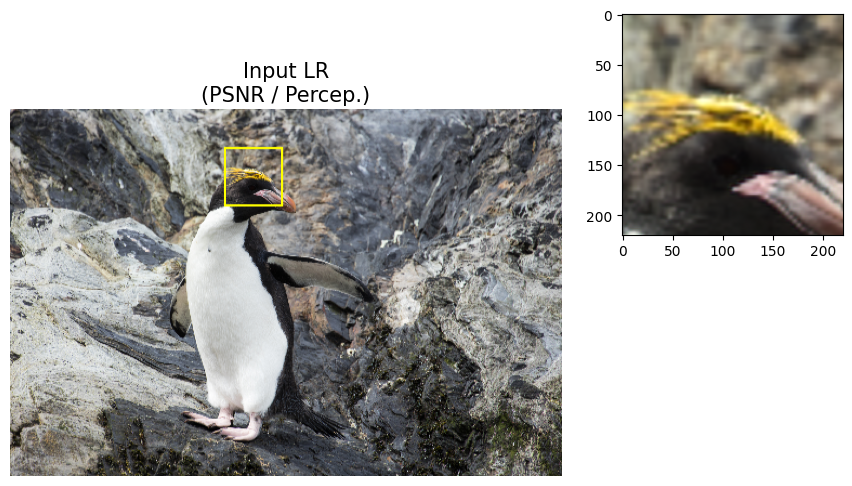

In [ ]:
from PIL import ImageDraw, Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# --- Config ---
row_images = all_rows[0]
labels = ["HR", "LR", "Bicubic", "CNN", "GAN", "Our" ]
psnr_vals = [float('inf'), float('inf'), 32.33, 32.82, 32.93, 30.33 ]
pl_vals   = [float('inf'), float('inf'), 6.84, 6.31, 6.89, 3.60 ]

# Patch box
# For a large 80×80 patch starting near the top center
patch_width = 220
patch_height = 220

# Center horizontally (e.g., center of 160 is 80)
left = 900 - patch_width // 2   # 40
right = left + patch_width     # 120

# Top-aligned near top (e.g., start at 20)
top = 140
bottom = top + patch_height    # 100

patch_box = (left, top, right, bottom)  # (40, 20, 120, 100)

def crop_patch(img_np, box):
    img_pil = Image.fromarray((img_np * 255).astype(np.uint8))
    return np.array(img_pil.crop(box)) / 255.0

fig = plt.figure(figsize=(18, 8))
gs = gridspec.GridSpec(2, 4, width_ratios=[2.5, 1, 1, 1])

# === Col 0: LR full image with yellow patch ===
lr_img = (row_images[0] * 255).astype(np.uint8)
lr_pil = Image.fromarray(lr_img)
scale_factor = 6
lr_pil = lr_pil.resize((lr_pil.width * scale_factor, lr_pil.height * scale_factor), Image.NEAREST)

# Scale the yellow box
# Step 3: Draw yellow rectangle AFTER resizing using scaled coordinates
scaled_box = tuple(v * scale_factor for v in patch_box)
# draw = ImageDraw.Draw(lr_pil)
# draw.rectangle(scaled_box, outline="yellow", width=3)
# === Draw yellow rectangle ===
draw = ImageDraw.Draw(lr_pil)
draw.rectangle(scaled_box, outline="yellow", width=50)  # Increase width if needed

# Display in grid (update GridSpec too!)
ax_lr = fig.add_subplot(gs[:, 0])
ax_lr.imshow(lr_pil)
ax_lr.set_title("Input LR\n(PSNR / Percep.)", fontsize=15)
ax_lr.axis("off")


# # === Top row: HR, Bicubic, SRCNN ===
# for i in range(3):
#     ax = fig.add_subplot(gs[0, i + 1])
#     patch = crop_patch(row_images[i + 1], patch_box)  # Skip LR = row_images[0]
#     ax.imshow(patch)
#     ax.set_title(f"{labels[i]}\n({psnr_vals[i]:.2f} / {pl_vals[i]:.2f})", fontsize=9)
#     ax.axis("off")

# # === Bottom row: EDSR, RCAN, EnhanceNet ===
# for i in range(3, 6):
#     ax = fig.add_subplot(gs[1, i - 2])  # gs[1,1], [1,2], [1,3]
#     patch = crop_patch(row_images[i + 1], patch_box)
#     ax.imshow(patch)
#     ax.set_title(f"{labels[i]}\n({psnr_vals[i]:.2f} / {pl_vals[i]:.2f})", fontsize=9)
#     ax.axis("off")

# === Top row: HR, Model1, Model2 ===
for i in range(3):
    ax = fig.add_subplot(gs[0, i + 1])
    patch = crop_patch(row_images[i + 1], patch_box)
    ax.imshow(patch)
    ax.set_title(f"{labels[i]}\n({all_psnrs[i]:.2f} / {pl_vals[i]:.2f})", fontsize=15)
    ax.axis("off")

# === Bottom row: Model3, Model4, Model5 ===
for i in range(3, 6):
    ax = fig.add_subplot(gs[1, i - 2])  # gs[1,1], [1,2], [1,3]
    patch = crop_patch(row_images[i + 1], patch_box)  # i+1 = 4,5,6
    ax.imshow(patch)
    ax.set_title(f"{labels[i]}\n({all_psnrs[i]:.2f} / {pl_vals[i]:.2f})", fontsize=15)
    ax.axis("off")

plt.tight_layout()
plt.show()
